In [1]:
import sys
import os
#import subprocess

#from functools import reduce

import pandas as pd
#import numpy as np
import matplotlib.pyplot as plt
import scienceplots
#import time
#from scipy.optimize import minimize
#from sklearn.linear_model import LinearRegression
#import glob
#import datetime
#import scipy
#from scipy.sparse import diags


#from scipy.linalg import solve_banded
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.ticker as ticker


#from sklearn.metrics import mean_squared_error


# Point de départ : dossier courant
current_dir = os.getcwd()

# Chemin du dossier 'modules' situé au même niveau que 'src'
module_path = os.path.abspath(os.path.join(current_dir, '..', 'libs'))
if module_path not in sys.path:
    sys.path.append(module_path)

# Maintenant, tu peux importer ton module
from SCOU_NC_Vanilla_NUTS_manual import *

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [2]:
def get_month_start_days():
    return pd.date_range('2023-01-01', '2023-12-31', freq='MS').dayofyear.tolist()

def get_month_start_labels():
    return pd.date_range('2023-01-01', '2023-12-31', freq='MS').strftime('%m-%d').tolist()

In [3]:
def get_sub_data(input_data, indicator):
    this_lod = lods_dict[indicator]
    
    output_data = input_data.copy()
    output_data = output_data.loc[::, ['dateStart', indicator, 'plantVolume']]
    output_data.columns = ['dateStart', 'obs_conc', 'plantVolume']
    output_data['lod_conc'] = this_lod
    
    # for error checking purpose
    output_data['obs_raw'] = output_data.obs_conc.copy()
    output_data['lod_raw'] = output_data.lod_conc.copy()
    
    output_data['obs'] = output_data.obs_conc 
    output_data['lod'] = output_data.lod_conc 
    
    output_data.obs = np.log(output_data.obs)
    output_data.lod = np.log(output_data.lod)
    
    columns = ['dateStart', 'obs', 'lod', 'plantVolume', 'obs_raw', 'lod_raw'] 
    output_data = output_data.loc[::, columns]
    output_data = output_data.set_index('dateStart').resample('D').mean().reset_index()  

    return output_data

In [4]:
def append_and_process_results(input_data, this_molecule):
    input_data['muX'] = snc_ar1_nuts_flux.muX
    input_data['ICL'] = snc_ar1_nuts_flux.CIL
    input_data['ICU'] = snc_ar1_nuts_flux.CIU
    input_data['pout'] = snc_ar1_nuts_flux.pointwise_pout
    
    input_data.obs = np.log10(np.exp(input_data.obs))
    input_data.muX = np.log10(np.exp(input_data.muX))
    input_data.ICL = np.log10(np.exp(input_data.ICL))
    input_data.ICU = np.log10(np.exp(input_data.ICU))
    common_flux_data[this_molecule] = input_data.copy() 

    return input_data

In [5]:
def visualize_results(input_data, this_molecule):
    
    with plt.style.context(['science', 'notebook', 'grid']):

        LABEL_SIZE = 30
        TICK_SIZE = 30
        TITLE_SIZE = 38
        LEGEND_SIZE = 30
        DATES_SIZE = 18
        figsize = (28, 10) #figsize = (32, 10)
        
        plt.rc('axes', labelsize=LABEL_SIZE)
        plt.rc('xtick', labelsize=TICK_SIZE)   
        plt.rc('ytick', labelsize=TICK_SIZE)
        plt.rc('figure', titlesize=TITLE_SIZE)
        plt.rc('legend', fontsize=LEGEND_SIZE)
        plt.rcParams['text.usetex'] = True
        
        fig = plt.figure(figsize=figsize, layout="constrained")
        
        ax_dict = fig.subplot_mosaic(
            """
            A
            """
        )
        
        ### A
        ax_dict['A'].plot(input_data.dateStart.values, input_data.muX.values, label='$X^*_{t_{opt}}$', color='green', linewidth=8, zorder=3)
        
        ax_dict['A'].plot(input_data.dateStart.values, input_data.ICL.values, label='95% CI', linestyle='--', color='green', linewidth=5, zorder=1)
        ax_dict['A'].plot(input_data.dateStart.values, input_data.ICU.values, linestyle='--', color='green', linewidth=5, zorder=1)
        
        ax_dict['A'].fill_between(input_data.dateStart.values, input_data.ICL.values, input_data.ICU.values, alpha=.3, color='green')
    
        
        scatter_points = ax_dict['A'].scatter(input_data.dateStart.values, input_data.obs.values, label='$\hat{X}_t$', 
                             c=input_data.pout.values,
                             cmap='bwr', edgecolor='black', s=360, zorder=3,
                             linewidths=1.5, alpha=0.9, vmin=0, vmax=1)
    
        
        ax_dict['A'].set_ylabel("Concentration (UG/L) - $\log_{10}$ scale")
        ax_dict['A'].set_xlabel("Sampling date")
        ax_dict['A'].tick_params(axis='x', labelsize=TICK_SIZE)
        ax_dict['A'].tick_params(axis='y', labelsize=TICK_SIZE)
        ax_dict['A'].grid(linewidth=1, color='black', alpha=0.8)
        ax_dict['A'].set_title(this_molecule, size=TITLE_SIZE)
    
        ### Outlier probability legend:
        cmin, cmax = 0.0, 1.0 
        axins1 = inset_axes(ax_dict['A'], width='2%', height='100%', loc='right', borderpad=0)
        axins1.grid(False)
        cbar = fig.colorbar(scatter_points, cax=axins1, orientation='vertical')
        
        # Setting tick limits:
        cbar.set_ticks([cmin, cmax])
        cbar.ax.yaxis.set_major_locator(ticker.FixedLocator([cmin, cmax]))
        
        # Standardizing the float format displayed:
        decimal_places = 1
        cbar.ax.set_yticklabels([f"{cmin:.{decimal_places}f}", f"{cmax:.{decimal_places}f}"], fontsize=TICK_SIZE)
    
        # Placing the label at the right spot:
        cbar.ax.set_ylabel('Outlier probability', size=TICK_SIZE, labelpad=-35)
    
        # Main legend
        plt.rcParams['text.usetex'] = False
        h1, l1 = ax_dict['A'].get_legend_handles_labels()
        fig.legend(h1, l1, loc='upper center', bbox_to_anchor=(0.5, 0), fancybox=True, shadow=True, ncol=5)
        
        plt.show()

In [6]:
wwtp = 'SEV'

In [7]:
filepath = '../data/samples_quantifications.xlsx'

raw_data = pd.read_excel(filepath, sheet_name=wwtp)
raw_data = raw_data.loc[1:]
raw_data = raw_data.rename(columns={wwtp:'dateStart',
                                   'Débit Total station':'plantVolume'})

raw_data.dateStart = pd.to_datetime(raw_data.dateStart)
raw_data.plantVolume = pd.to_numeric(raw_data.plantVolume)
raw_data.DBO = pd.to_numeric(raw_data.DBO)
raw_data.DCO = pd.to_numeric(raw_data.DCO)
raw_data.MES = pd.to_numeric(raw_data.MES)
raw_data.NGL = pd.to_numeric(raw_data.NGL)
raw_data.NH4 = pd.to_numeric(raw_data.NH4)
raw_data.NTK = pd.to_numeric(raw_data.NTK)
raw_data.PT = pd.to_numeric(raw_data.PT)

raw_data['month'] = raw_data.dateStart.dt.month
raw_data['year'] = raw_data.dateStart.dt.year
raw_data['day'] = raw_data.dateStart.dt.dayofyear

In [8]:
lods_dict = {}
lods_dict['DBO'] = 1
lods_dict['DCO'] = 4
lods_dict['MES'] = 2
lods_dict['NH4'] = 0.3
lods_dict['NTK'] = 0.5
lods_dict['NGL'] = 0.92
lods_dict['PT'] = 0.3

In [9]:
subraw_data = raw_data.copy()
subraw_data = subraw_data.loc[~subraw_data.dateStart.isna()]
subraw_data.plantVolume = subraw_data.plantVolume.replace(0, 1) # avoid inf after log-transformation
subraw_data = subraw_data.loc[subraw_data.year>=2020]

In [10]:
chain_selector_dict = {}
chain_selector_dict['DBO'] = [8, 2]
chain_selector_dict['DCO'] = [8, 2]
chain_selector_dict['MES'] = [2, 6]
chain_selector_dict['NH4'] = []
chain_selector_dict['NTK'] = [2, 8, 9]
chain_selector_dict['NGL'] = [0, 5]
chain_selector_dict['PT'] = [2]

In [11]:
nb_chains = 10
tuning_iters = 4000
sampling_iters = 2000

DBO


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1332 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 8 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.160  0.178   0.068    0.555      0.054    0.039      19.0      14.0   
eps    0.284  0.807   0.082    0.915      0.114    0.081      20.0      51.0   
p_out  0.222  0.388   0.020    0.999      0.122    0.089      20.0      51.0   

       r_hat  
sig     1.47  
eps     1.42  
p_out   1.42  


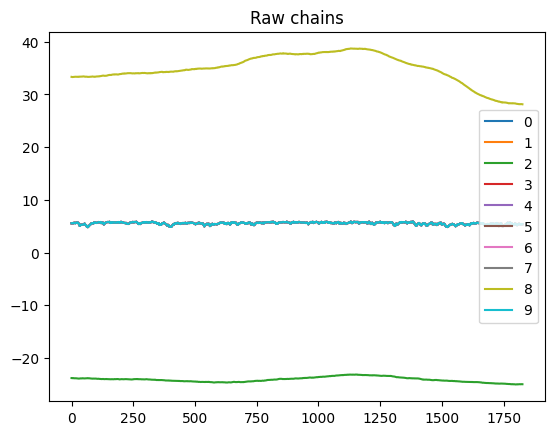

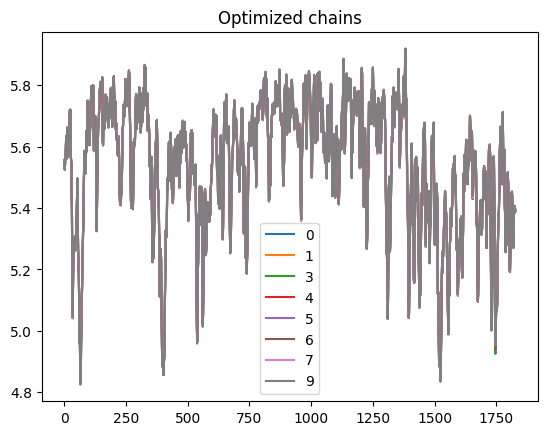

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.082  0.005   0.074    0.091        0.0      0.0    1171.0    2343.0   
eps    0.099  0.004   0.091    0.107        0.0      0.0    2732.0    5505.0   
p_out  0.028  0.006   0.018    0.039        0.0      0.0    5930.0    9144.0   

       r_hat  
sig     1.01  
eps     1.00  
p_out   1.00  


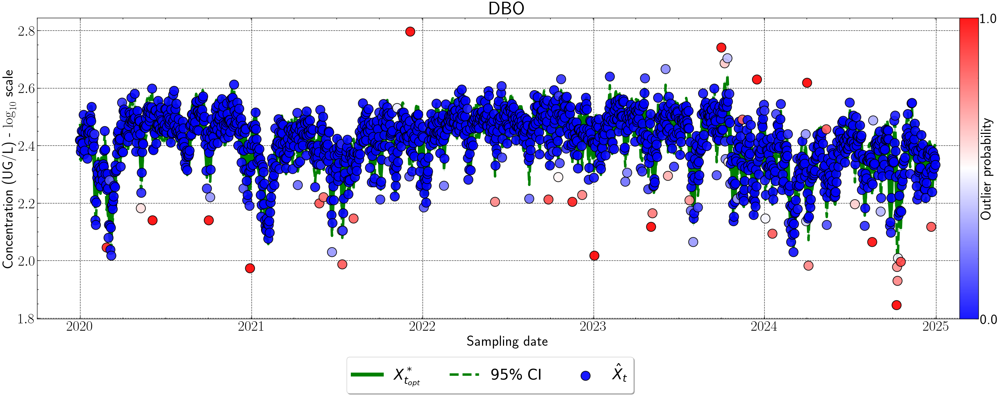

DCO


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1260 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 8 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.149  0.256   0.063    0.476      0.072    0.052      19.0      11.0   
eps    0.191  0.588   0.071    0.595      0.084    0.060      27.0      29.0   
p_out  0.149  0.311   0.022    0.998      0.092    0.067      22.0      27.0   

       r_hat  
sig     1.47  
eps     1.27  
p_out   1.41  


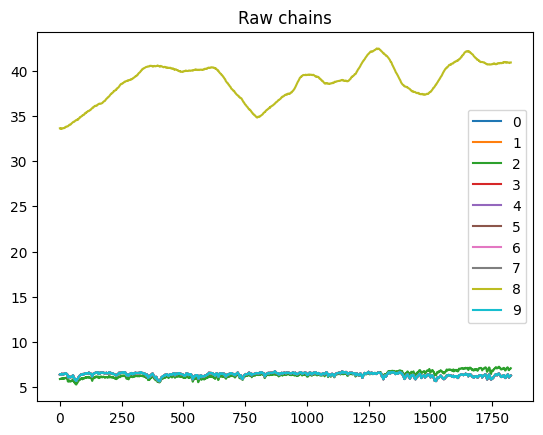

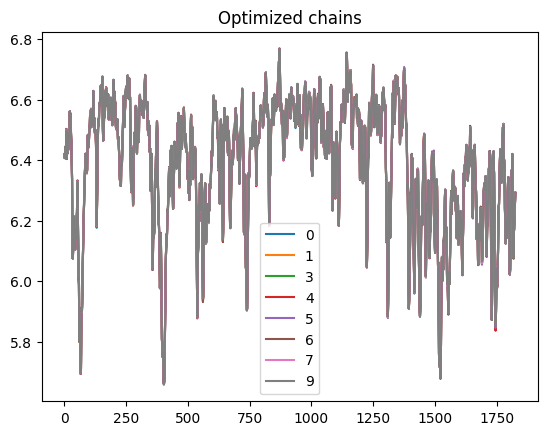

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.076  0.004   0.069    0.083        0.0      0.0    1581.0    3781.0   
eps    0.086  0.004   0.078    0.094        0.0      0.0    2322.0    4879.0   
p_out  0.036  0.007   0.024    0.049        0.0      0.0    6156.0    9923.0   

       r_hat  
sig      1.0  
eps      1.0  
p_out    1.0  


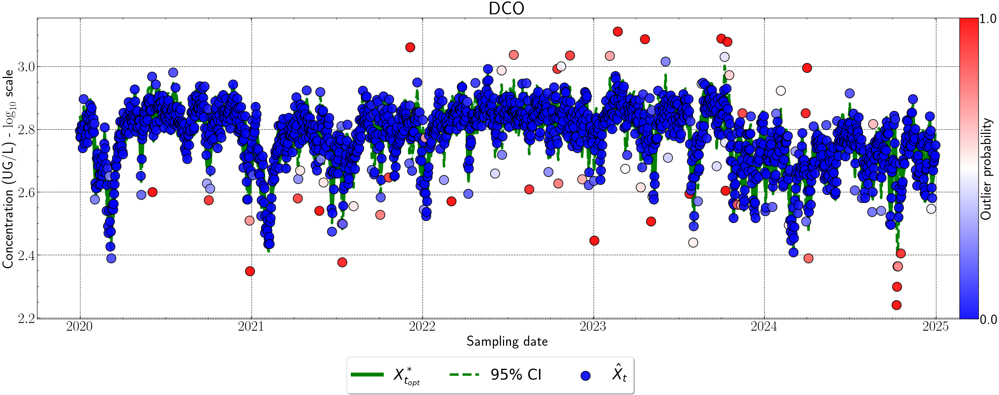

MES


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1183 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 6 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.405  1.102   0.041    3.156      0.329    0.239      19.0      22.0   
eps    0.228  0.602   0.107    0.606      0.084    0.060      23.0      24.0   
p_out  0.134  0.312   0.014    0.999      0.093    0.068      32.0      29.0   

       r_hat  
sig     1.48  
eps     1.35  
p_out   1.30  


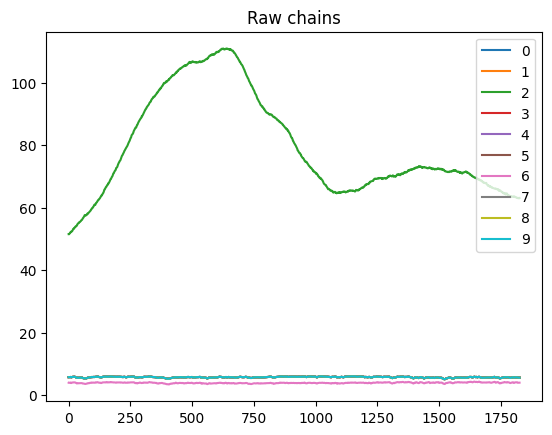

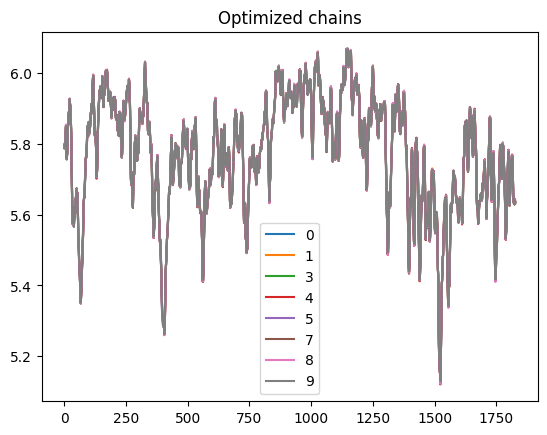

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.052  0.003   0.046    0.059        0.0      0.0     743.0    1405.0   
eps    0.124  0.003   0.118    0.130        0.0      0.0    4552.0    9258.0   
p_out  0.021  0.004   0.013    0.029        0.0      0.0   17636.0   12125.0   

       r_hat  
sig     1.02  
eps     1.00  
p_out   1.00  


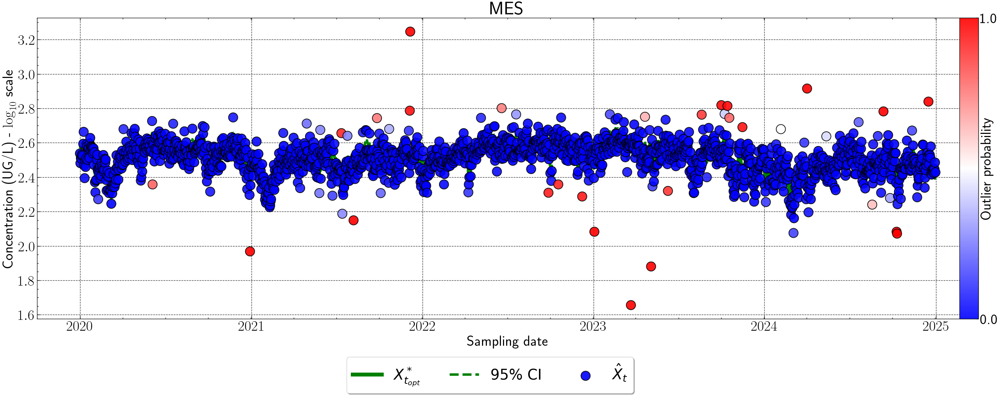

NH4


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 529 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.084  0.003   0.077    0.090      0.000    0.000      86.0     549.0   
eps    0.037  0.004   0.029    0.044      0.000    0.000     375.0     516.0   
p_out  0.095  0.010   0.076    0.114      0.001    0.001     157.0     574.0   

       r_hat  
sig     1.08  
eps     1.04  
p_out   1.04  


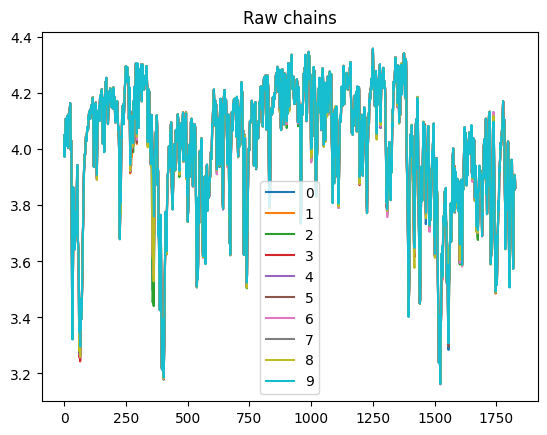

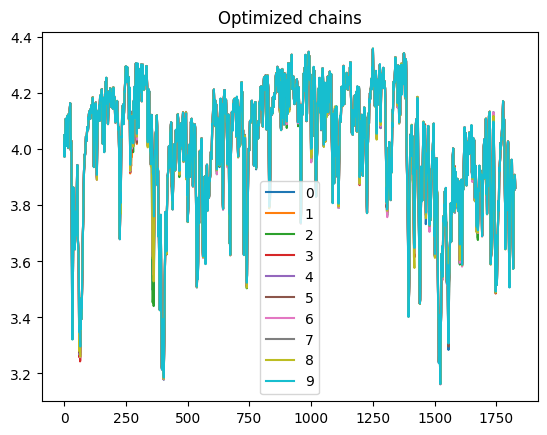

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.084  0.003   0.077    0.090      0.000    0.000      86.0     549.0   
eps    0.037  0.004   0.029    0.044      0.000    0.000     375.0     516.0   
p_out  0.095  0.010   0.076    0.114      0.001    0.001     157.0     574.0   

       r_hat  
sig     1.08  
eps     1.04  
p_out   1.04  


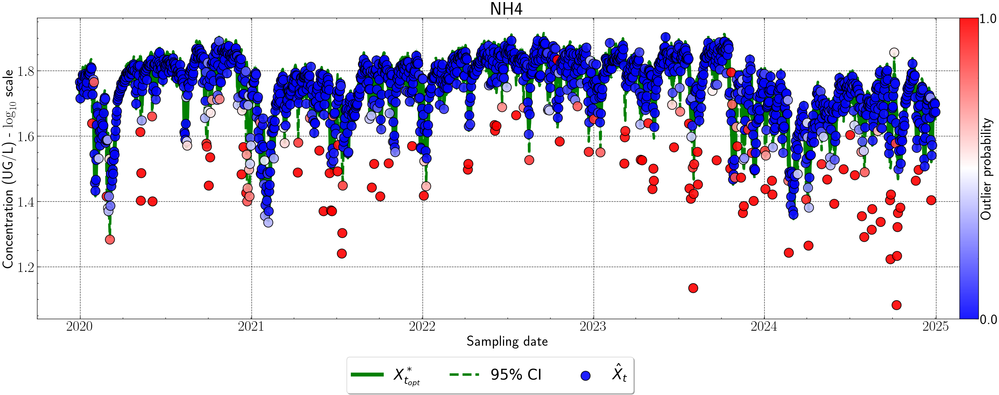

NTK


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1466 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 8 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 9 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.243  0.405   0.067    1.281      0.123    0.089      15.0      14.0   
eps    0.316  0.981   0.028    1.174      0.132    0.094      17.0      91.0   
p_out  0.355  0.421   0.068    0.999      0.133    0.097      17.0      99.0   

       r_hat  
sig     1.73  
eps     1.57  
p_out   1.57  


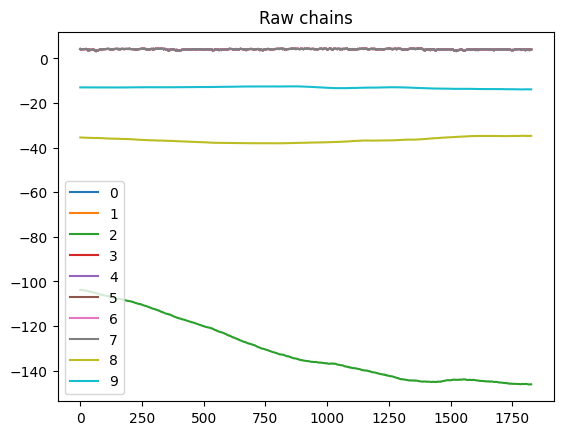

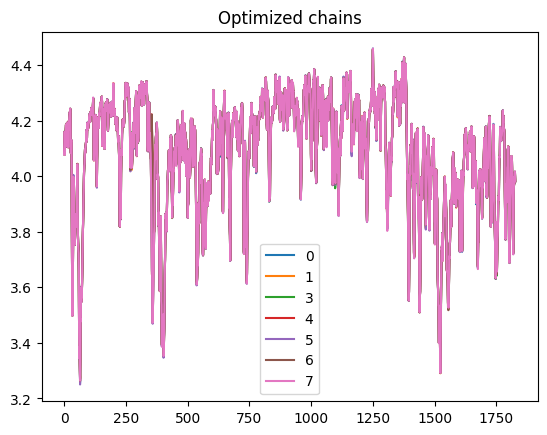

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.076  0.003   0.071    0.082        0.0      0.0     348.0    2665.0   
eps    0.040  0.003   0.033    0.046        0.0      0.0     633.0     808.0   
p_out  0.080  0.008   0.064    0.095        0.0      0.0    1538.0    4069.0   

       r_hat  
sig     1.02  
eps     1.01  
p_out   1.01  


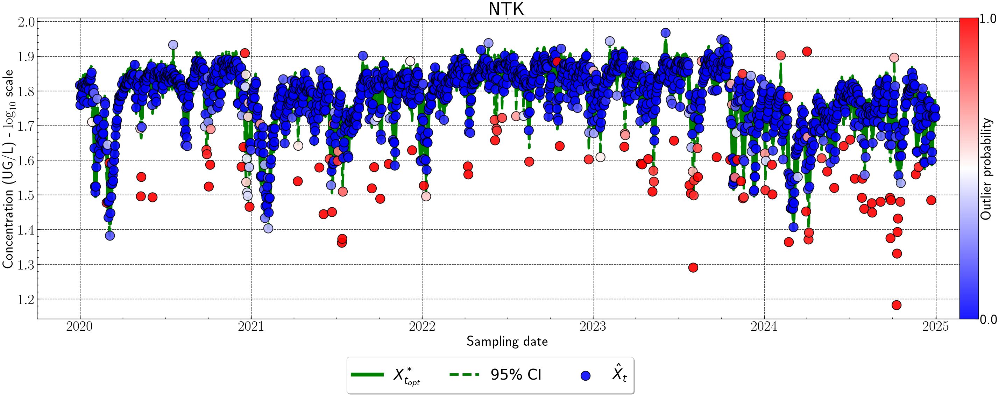

NGL


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1331 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 5 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.384  0.787   0.065    2.248      0.238    0.173      19.0      22.0   
eps    0.230  0.730   0.029    0.965      0.119    0.085      20.0      51.0   
p_out  0.262  0.368   0.066    0.999      0.116    0.085      20.0      50.0   

       r_hat  
sig     1.48  
eps     1.44  
p_out   1.42  


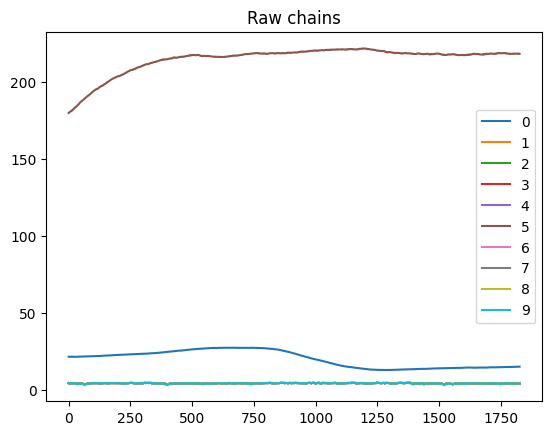

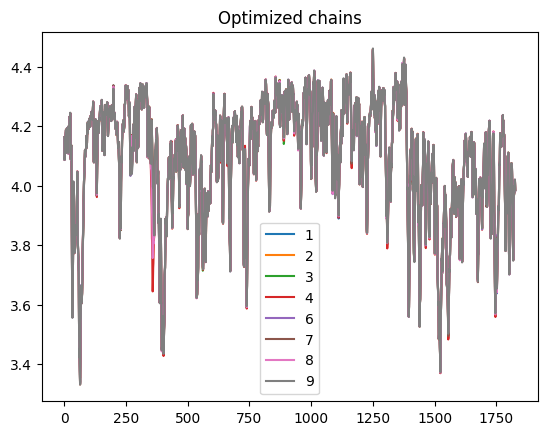

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.075  0.003   0.069    0.081        0.0      0.0    1153.0    2357.0   
eps    0.040  0.003   0.034    0.047        0.0      0.0     629.0    1632.0   
p_out  0.078  0.008   0.062    0.094        0.0      0.0    1711.0    3477.0   

       r_hat  
sig     1.02  
eps     1.02  
p_out   1.01  


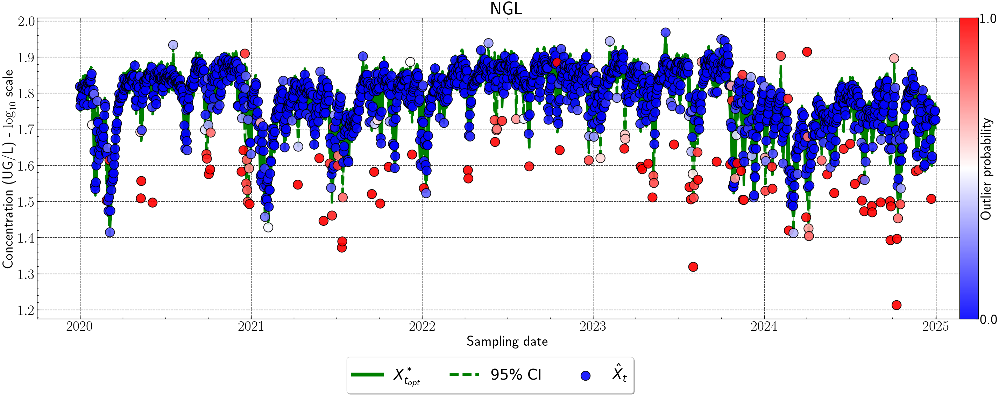

PT


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1049 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.116  0.101   0.072    0.330      0.031    0.023      29.0      12.0   
eps    0.165  0.620   0.056    0.497      0.085    0.061      30.0      21.0   
p_out  0.121  0.292   0.016    0.999      0.092    0.067      29.0      21.0   

       r_hat  
sig     1.26  
eps     1.25  
p_out   1.25  


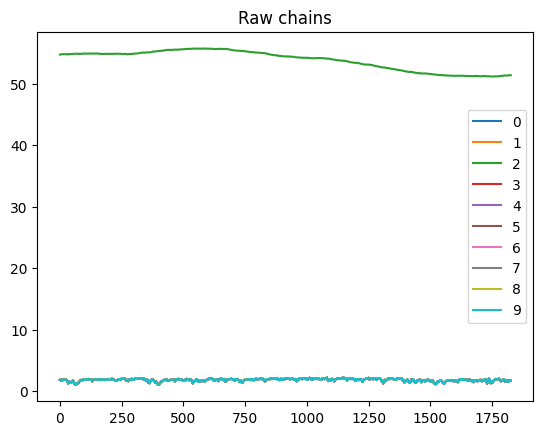

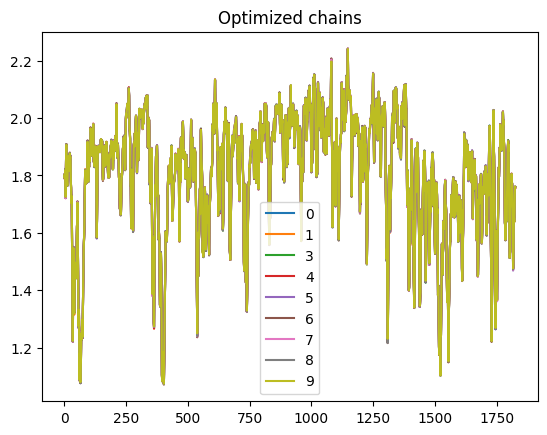

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.085  0.004   0.078    0.093        0.0      0.0    2026.0    3987.0   
eps    0.071  0.004   0.063    0.079        0.0      0.0    1580.0    2380.0   
p_out  0.024  0.006   0.014    0.034        0.0      0.0    3051.0    7821.0   

       r_hat  
sig      1.0  
eps      1.0  
p_out    1.0  


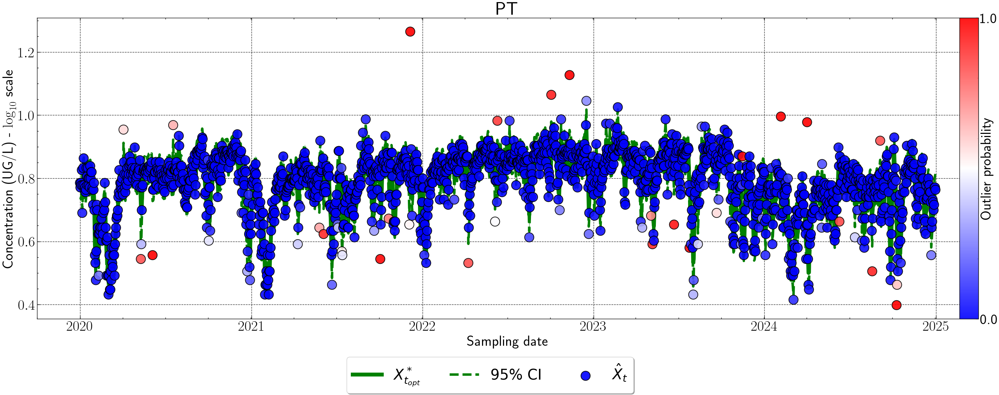

In [12]:
common_flux_data = {}
### Global loop
for this_molecule in list(chain_selector_dict.keys()):

    print("==========")
    print(this_molecule)
    print("==========")
    
    sub_data = get_sub_data(subraw_data, this_molecule)

    lod_vect = sub_data.lod.values
    observation_matrix = sub_data.obs.values
    
    snc_ar1_nuts_flux = SCOU_RW1_NUTS(observation_matrix, lod_vect, tuning_iters=tuning_iters, sampling_iters=sampling_iters,
                                 export_name=None, 
                                 p_out_frozen=-1, nb_chains=nb_chains, export_chains=False,
                                 RW_order=1)
    snc_ar1_nuts_flux.fit()

    # getting rid of strongly diverging chains:
    selected_chains = np.arange(nb_chains).tolist()
    remove_those = chain_selector_dict[this_molecule]
    for i in remove_those:
        selected_chains.remove(i)
    
    snc_ar1_nuts_flux.visualize_latents(selected_chains)
    snc_ar1_nuts_flux.predict(selected_chains)

    sub_data = append_and_process_results(sub_data, this_molecule)
    visualize_results(sub_data, this_molecule)

In [14]:
for molecule in list(common_flux_data.keys()):
    this_file = common_flux_data[molecule]
    this_file.to_csv('../outputs/files/pop_estimation_SEV_conc/' + molecule + '.csv', sep=';', index=False)

In [ ]:
### MAV

In [19]:
wwtp = 'MAV'

In [20]:
filepath = '../data/samples_quantifications.xlsx'

raw_data = pd.read_excel(filepath, sheet_name=wwtp)
raw_data = raw_data.loc[1:]
raw_data = raw_data.rename(columns={wwtp:'dateStart',
                                   'Débit Total station':'plantVolume'})

raw_data.dateStart = pd.to_datetime(raw_data.dateStart)
raw_data.plantVolume = pd.to_numeric(raw_data.plantVolume)
raw_data.DBO = pd.to_numeric(raw_data.DBO)
raw_data.DCO = pd.to_numeric(raw_data.DCO)
raw_data.MES = pd.to_numeric(raw_data.MES)
raw_data.NGL = pd.to_numeric(raw_data.NGL)
raw_data.NH4 = pd.to_numeric(raw_data.NH4)
raw_data.NTK = pd.to_numeric(raw_data.NTK)
raw_data.PT = pd.to_numeric(raw_data.PT)

raw_data['month'] = raw_data.dateStart.dt.month
raw_data['year'] = raw_data.dateStart.dt.year
raw_data['day'] = raw_data.dateStart.dt.dayofyear

subraw_data = raw_data.copy()
subraw_data = subraw_data.loc[~subraw_data.dateStart.isna()]
subraw_data.plantVolume = subraw_data.plantVolume.replace(0, 1) # avoid inf after log-transformation
subraw_data = subraw_data.loc[subraw_data.year>=2020]

In [21]:
chain_selector_dict = {}
chain_selector_dict['DBO'] = [6]
chain_selector_dict['DCO'] = [0, 6]
chain_selector_dict['MES'] = []
chain_selector_dict['NH4'] = [5]
chain_selector_dict['NTK'] = [5, 4, 9, 3, 7, 6]
chain_selector_dict['NGL'] = [0, 2, 8]
chain_selector_dict['PT'] = [2, 3, 0, 1]

DBO


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1290 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 6 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.138  0.192   0.063    0.546      0.058    0.042      29.0      12.0   
eps    0.200  0.456   0.103    0.495      0.074    0.053      29.0      22.0   
p_out  0.124  0.291   0.019    0.999      0.092    0.067      29.0      22.0   

       r_hat  
sig     1.26  
eps     1.25  
p_out   1.24  


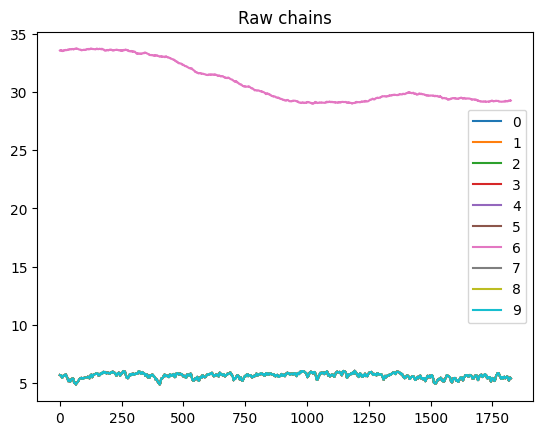

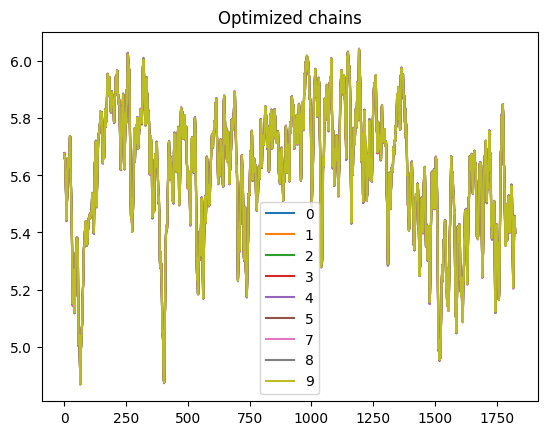

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.080  0.004   0.072    0.089        0.0      0.0    1465.0    2873.0   
eps    0.119  0.004   0.112    0.127        0.0      0.0    4594.0    9181.0   
p_out  0.027  0.005   0.017    0.037        0.0      0.0   17097.0   13621.0   

       r_hat  
sig     1.01  
eps     1.00  
p_out   1.00  


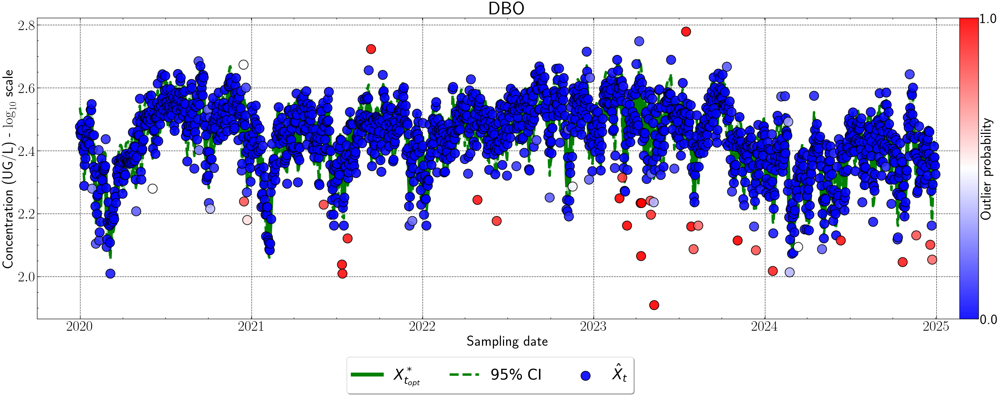

DCO


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1542 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 6 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.175  0.235   0.056    0.684      0.070    0.051      20.0      22.0   
eps    0.270  0.876   0.079    0.922      0.108    0.077      20.0      53.0   
p_out  0.217  0.390   0.015    0.999      0.123    0.090      20.0      49.0   

       r_hat  
sig     1.45  
eps     1.42  
p_out   1.42  


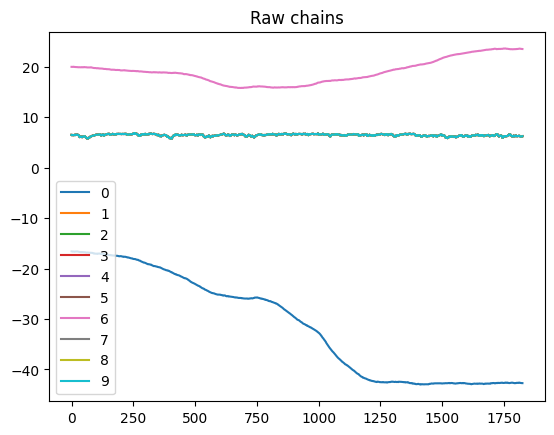

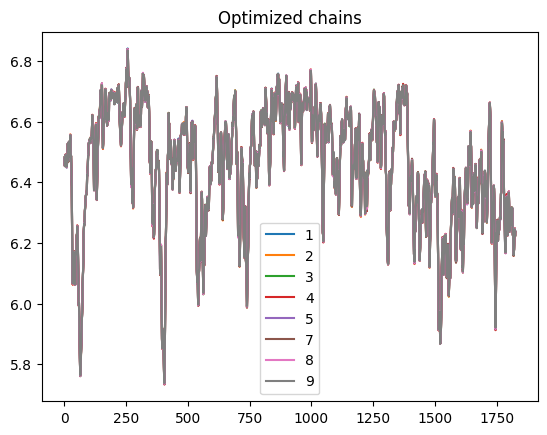

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.067  0.004   0.060    0.074        0.0      0.0    1339.0    2670.0   
eps    0.093  0.003   0.086    0.099        0.0      0.0    3235.0    7633.0   
p_out  0.022  0.005   0.013    0.031        0.0      0.0   12802.0   11118.0   

       r_hat  
sig     1.01  
eps     1.00  
p_out   1.00  


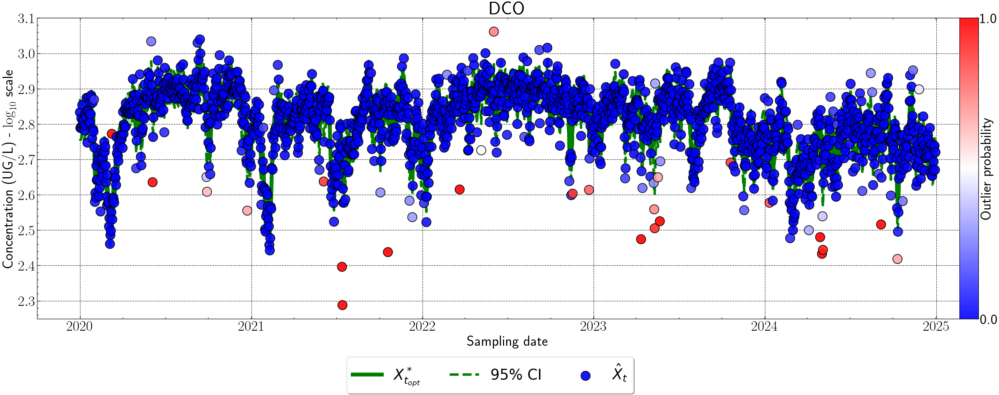

MES


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 955 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.059  0.004   0.052    0.066        0.0      0.0    1026.0    2465.0   
eps    0.122  0.004   0.116    0.129        0.0      0.0    5072.0   11226.0   
p_out  0.020  0.005   0.011    0.029        0.0      0.0   21162.0   16548.0   

       r_hat  
sig     1.02  
eps     1.00  
p_out   1.00  


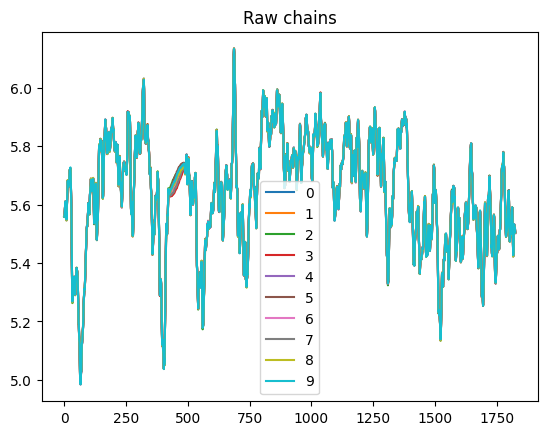

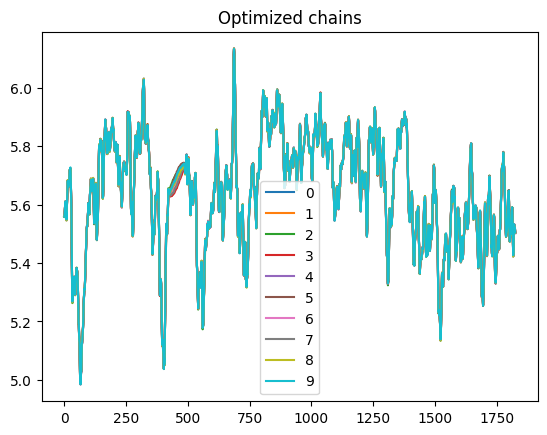

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.059  0.004   0.052    0.066        0.0      0.0    1026.0    2465.0   
eps    0.122  0.004   0.116    0.129        0.0      0.0    5072.0   11226.0   
p_out  0.020  0.005   0.011    0.029        0.0      0.0   21162.0   16548.0   

       r_hat  
sig     1.02  
eps     1.00  
p_out   1.00  


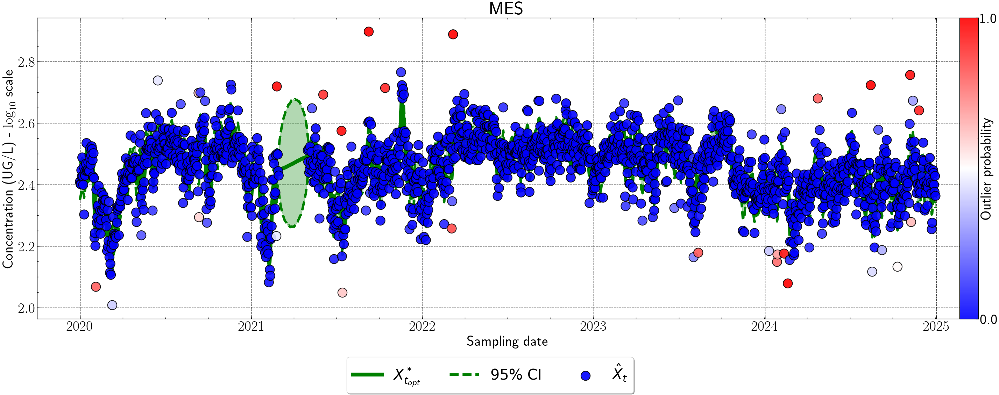

NH4


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 1151 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 5 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.233  0.481   0.065    1.487      0.149    0.108      29.0      15.0   
eps    0.163  0.531   0.059    0.469      0.082    0.059      30.0      22.0   
p_out  0.135  0.287   0.030    0.999      0.091    0.066      29.0      22.0   

       r_hat  
sig     1.26  
eps     1.25  
p_out   1.24  


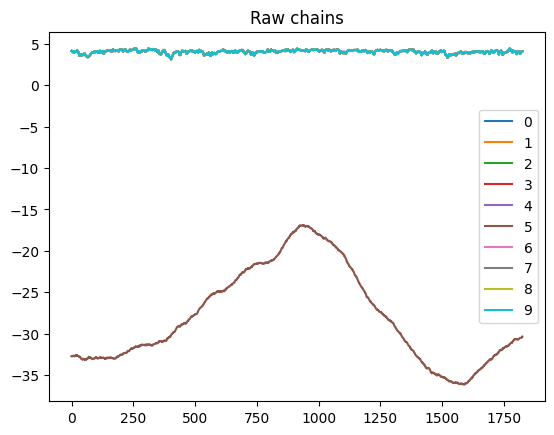

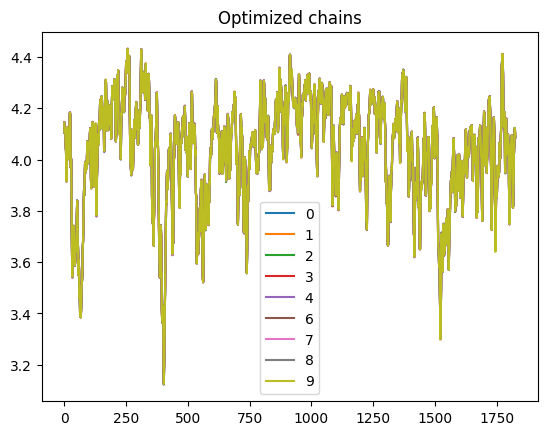

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.079  0.004   0.072    0.086        0.0      0.0    2454.0    4801.0   
eps    0.073  0.004   0.066    0.080        0.0      0.0    2680.0    4075.0   
p_out  0.039  0.006   0.027    0.051        0.0      0.0    8542.0   10953.0   

       r_hat  
sig      1.0  
eps      1.0  
p_out    1.0  


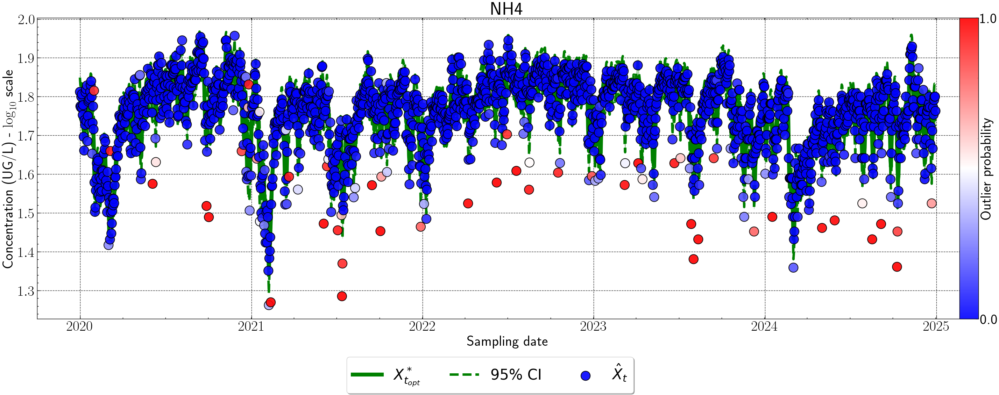

NTK


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 2456 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 4 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 5 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 6 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 7 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.

Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.577  0.613   0.062    1.749      0.185    0.134      12.0      21.0   
eps    0.593  1.183   0.028    1.873      0.140    0.099      16.0     163.0   
p_out  0.616  0.466   0.038    1.000      0.147    0.107      16.0     142.0   

       r_hat  
sig     2.56  
eps     1.66  
p_out   1.67  


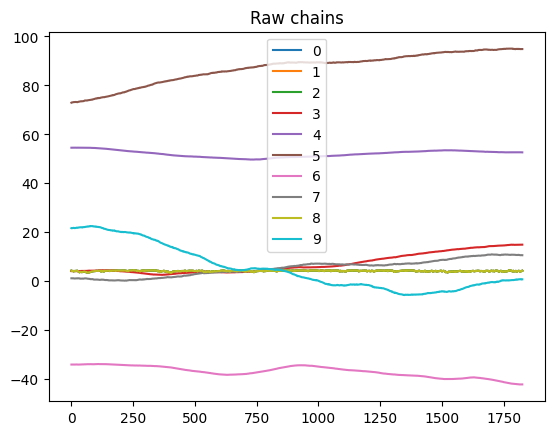

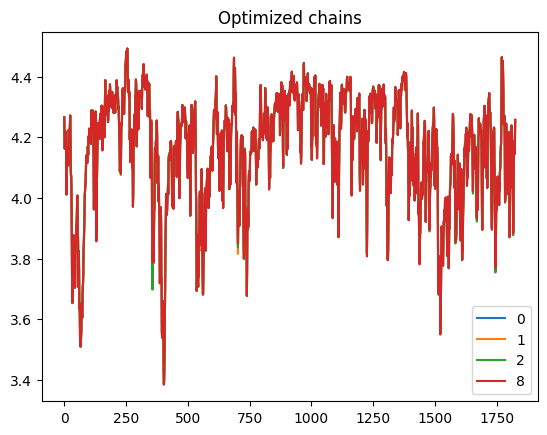

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.072  0.003   0.067    0.077        0.0      0.0     170.0     911.0   
eps    0.037  0.003   0.031    0.043        0.0      0.0     411.0     633.0   
p_out  0.045  0.007   0.032    0.058        0.0      0.0     316.0    1167.0   

       r_hat  
sig     1.03  
eps     1.01  
p_out   1.02  


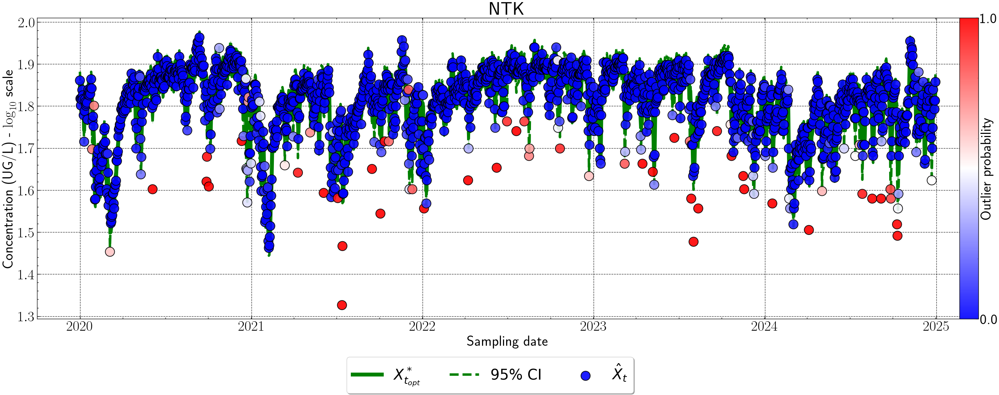

NGL


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 5976 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 116 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 8 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.329  0.509   0.060    1.405      0.148    0.107      16.0      29.0   
eps    0.297  0.967   0.026    1.115      0.129    0.092      17.0      82.0   
p_out  0.309  0.421   0.041    0.999      0.129    0.094      17.0      85.0   

       r_hat  
sig     1.67  
eps     1.58  
p_out   1.55  


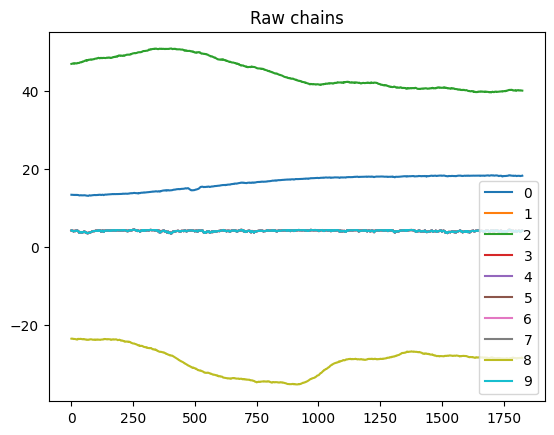

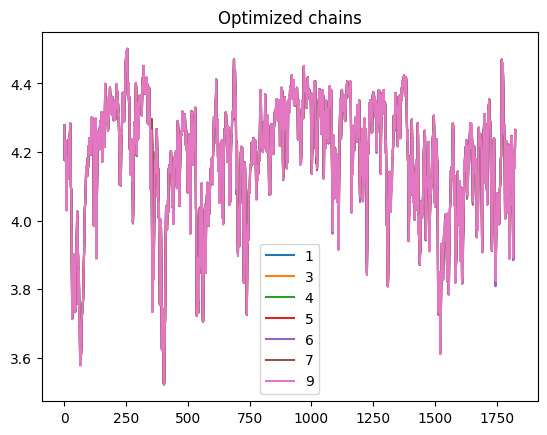

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.068  0.003   0.063    0.074        0.0      0.0     916.0    2434.0   
eps    0.036  0.003   0.030    0.042        0.0      0.0     671.0    1284.0   
p_out  0.051  0.007   0.037    0.065        0.0      0.0     349.0    2168.0   

       r_hat  
sig     1.02  
eps     1.01  
p_out   1.02  


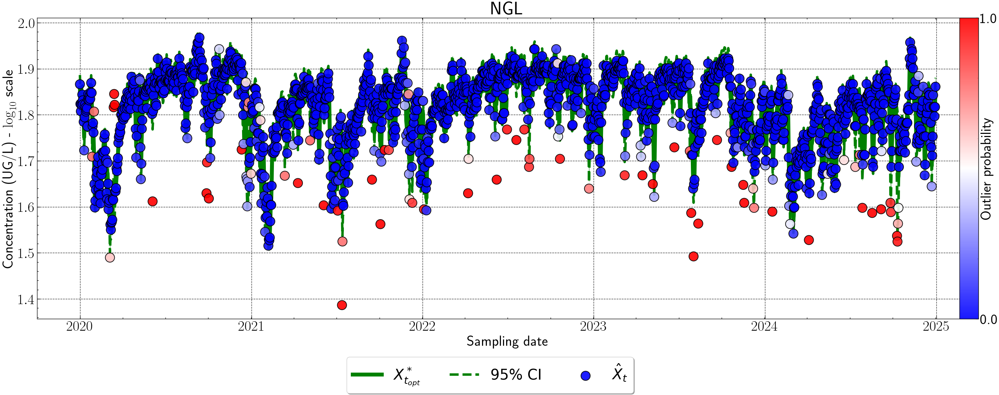

PT


/opt/anaconda3/envs/pymc5/lib/python3.9/site-packages/pymc/distributions/timeseries.py:558: UserWarning: Initial distribution not specified, defaulting to `Normal.dist(0, 100, shape=...)`. You can specify an init_dist manually to suppress this warning.
  warnings.warn(
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 4 jobs)
NUTS: [sig, eps, p_out, latent]


Sampling 10 chains for 4_000 tune and 2_000 draw iterations (40_000 + 20_000 draws total) took 3599 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


Raw summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.362  0.478   0.062    1.306      0.139    0.101      14.0      32.0   
eps    0.439  1.306   0.051    1.434      0.141    0.100      16.0     159.0   
p_out  0.412  0.478   0.016    0.999      0.151    0.110      16.0     141.0   

       r_hat  
sig     1.89  
eps     1.66  
p_out   1.66  


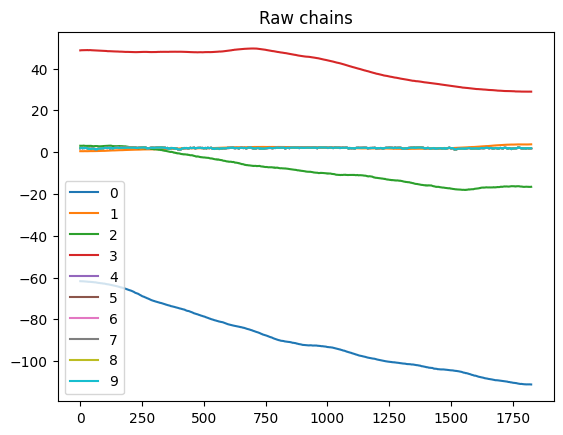

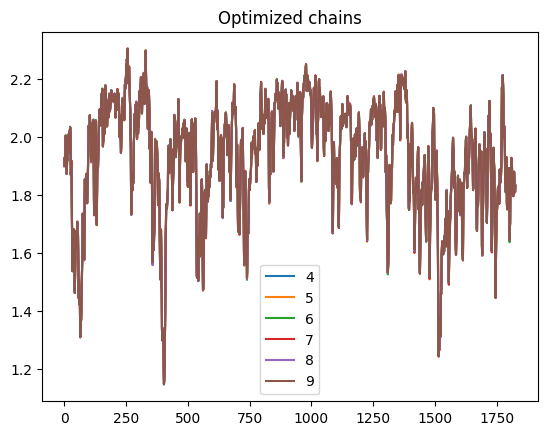

Best chain combination summary:
        mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
sig    0.073  0.003   0.066    0.079        0.0      0.0    1017.0    1880.0   
eps    0.064  0.003   0.058    0.070        0.0      0.0     950.0    1201.0   
p_out  0.022  0.005   0.013    0.030        0.0      0.0    3851.0    6407.0   

       r_hat  
sig      1.0  
eps      1.0  
p_out    1.0  


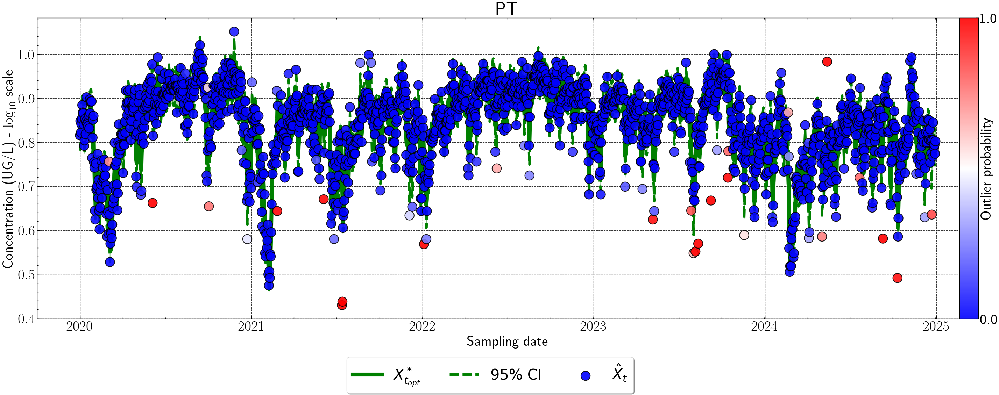

In [22]:
common_flux_data = {}
### Global loop
for this_molecule in list(chain_selector_dict.keys()):

    print("==========")
    print(this_molecule)
    print("==========")
    
    sub_data = get_sub_data(subraw_data, this_molecule)

    lod_vect = sub_data.lod.values
    observation_matrix = sub_data.obs.values
    
    snc_ar1_nuts_flux = SCOU_RW1_NUTS(observation_matrix, lod_vect, tuning_iters=tuning_iters, sampling_iters=sampling_iters,
                                 export_name=None, 
                                 p_out_frozen=-1, nb_chains=nb_chains, export_chains=False,
                                 RW_order=1)
    snc_ar1_nuts_flux.fit()

    # getting rid of strongly diverging chains:
    selected_chains = np.arange(nb_chains).tolist()
    remove_those = chain_selector_dict[this_molecule]
    for i in remove_those:
        selected_chains.remove(i)
    
    snc_ar1_nuts_flux.visualize_latents(selected_chains)
    snc_ar1_nuts_flux.predict(selected_chains)

    sub_data = append_and_process_results(sub_data, this_molecule)
    visualize_results(sub_data, this_molecule)

In [23]:
for molecule in list(common_flux_data.keys()):
    this_file = common_flux_data[molecule]
    this_file.to_csv('../outputs/files/pop_estimation_MAV_conc/' + molecule + '.csv', sep=';', index=False)